In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from PIL import Image

# Define the dataset path (Kaggle specific path)
data_dir = Path('/kaggle/input/plantvillage-dataset/color')

# Get all subdirectories (each folder is a class)
classes = [f.name for f in data_dir.iterdir() if f.is_dir()]
print(f"Total Classes: {len(classes)}")
print(f"Sample Classes: {classes[:5]}")

Total Classes: 38
Sample Classes: ['Tomato___Late_blight', 'Tomato___healthy', 'Grape___healthy', 'Orange___Haunglongbing_(Citrus_greening)', 'Soybean___healthy']


/tmp/ipykernel_245/3473358502.py:17: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_dist, y='Disease_Class', x='Image_Count', palette='magma')


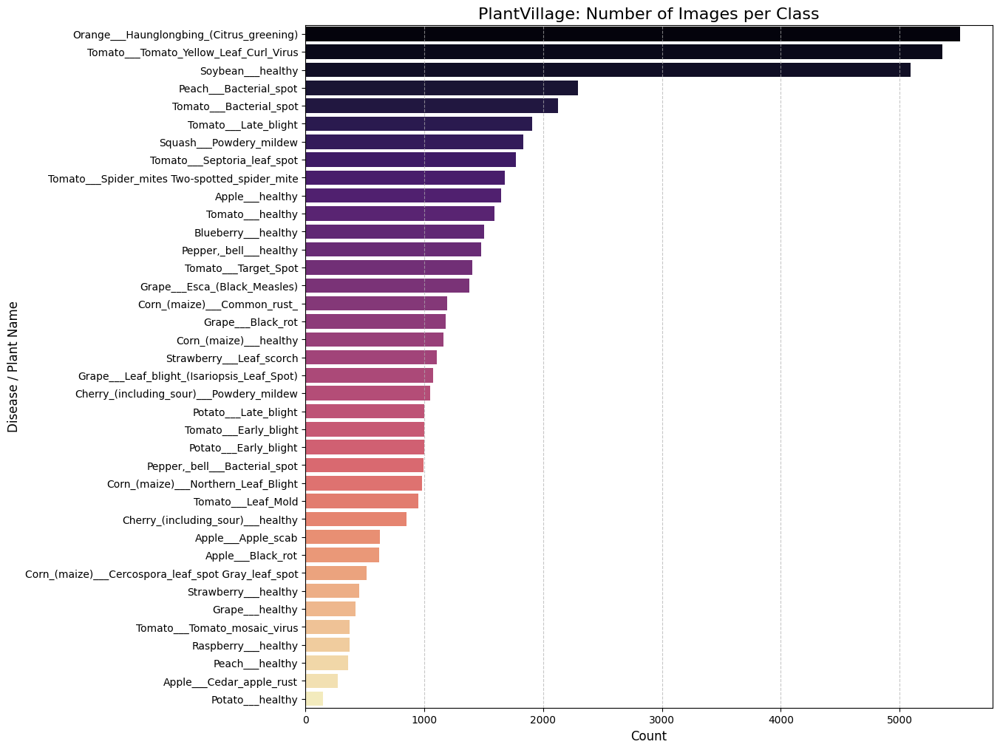

📊 Total images in dataset: 54305
📈 Most represented: Orange___Haunglongbing_(Citrus_greening) (5507 images)
📉 Least represented: Potato___healthy (152 images)


In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# 1. Collect counts for all 38 classes
class_counts = []
for cls in classes:
    # Count all files in the subdirectory
    count = len(list((data_dir / cls).iterdir()))
    class_counts.append({'Disease_Class': cls, 'Image_Count': count})

# 2. Convert to DataFrame for easier plotting
df_dist = pd.DataFrame(class_counts).sort_values(by='Image_Count', ascending=False)

# 3. Create the Visualization
plt.figure(figsize=(12, 12))
sns.barplot(data=df_dist, y='Disease_Class', x='Image_Count', palette='magma')
plt.title('PlantVillage: Number of Images per Class', fontsize=16)
plt.xlabel('Count', fontsize=12)
plt.ylabel('Disease / Plant Name', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

# 4. Quick Summary Statistics
print(f"📊 Total images in dataset: {df_dist['Image_Count'].sum()}")
print(f"📈 Most represented: {df_dist.iloc[0]['Disease_Class']} ({df_dist.iloc[0]['Image_Count']} images)")
print(f"📉 Least represented: {df_dist.iloc[-1]['Disease_Class']} ({df_dist.iloc[-1]['Image_Count']} images)")

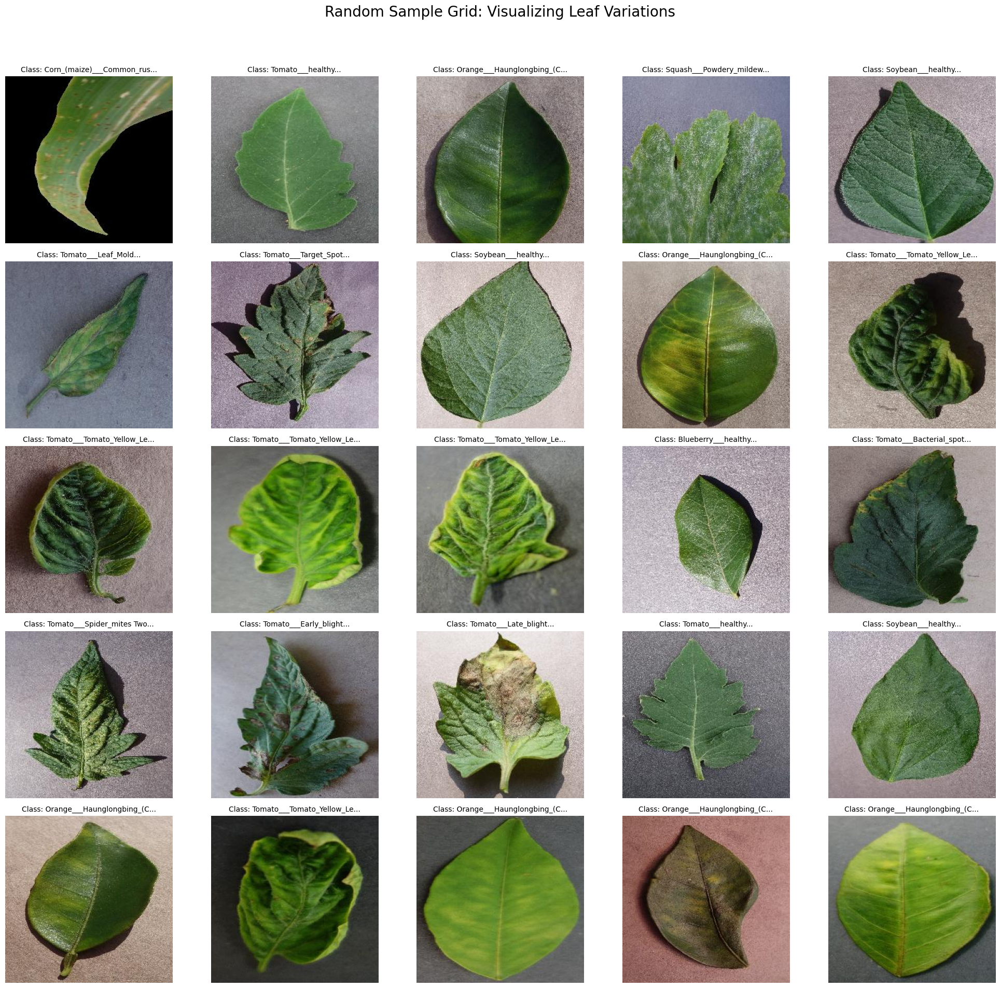

In [11]:
import matplotlib.pyplot as plt
from PIL import Image
import random

def visualize_random_samples(data_dir, n_images=25):
    # Get all image paths in the entire dataset
    all_image_paths = list(data_dir.glob('*/*.JPG')) + list(data_dir.glob('*/*.png'))
    
    # Pick random samples
    sample_paths = random.sample(all_image_paths, n_images)
    
    # Set up the grid
    plt.figure(figsize=(20, 20))
    for i, img_path in enumerate(sample_paths):
        plt.subplot(5, 5, i + 1)
        
        # Load image
        img = Image.open(img_path)
        plt.imshow(img)
        
        # Get class name from parent folder
        class_name = img_path.parent.name
        plt.title(f"Class: {class_name[:25]}...", fontsize=10)
        plt.axis('off')
        
    plt.suptitle("Random Sample Grid: Visualizing Leaf Variations", fontsize=20)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Run the visualization
visualize_random_samples(data_dir)

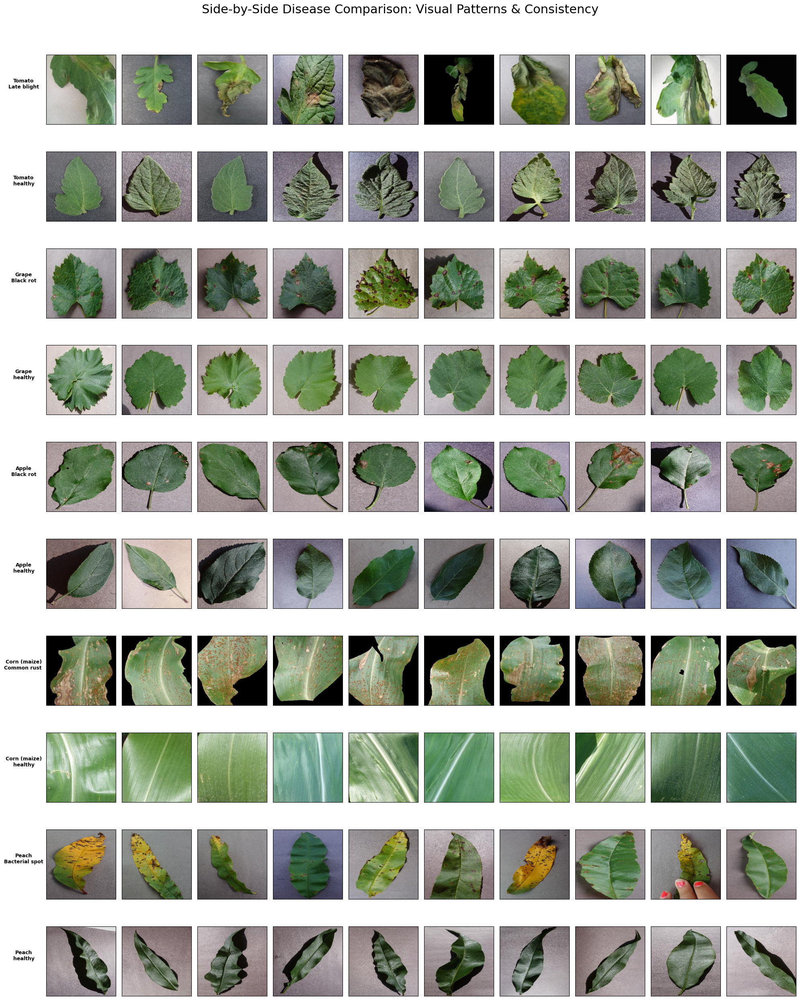

In [13]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from PIL import Image
import random
from tqdm import tqdm

def analyze_image_properties(data_dir, samples=500):
    all_paths = list(data_dir.glob('*/*.JPG')) + list(data_dir.glob('*/*.png'))
    sample_paths = random.sample(all_paths, samples)
    
    properties = []
    for path in tqdm(sample_paths, desc="Checking dimensions"):
        with Image.open(path) as img:
            w, h = img.size
            properties.append({
                'width': w, 
                'height': h, 
                'aspect_ratio': w/h,
                'class': path.parent.name
            })
            
    df_props = pd.DataFrame(properties)
    
    # Visualization 1: Scatter plot of Width vs Height
    plt.figure(figsize=(10, 6))
    sns.scatterplot(data=df_props, x='width', y='height', alpha=0.5)
    plt.title('Image Dimensions Distribution (Width vs Height)')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.show()
    
    # Visualization 2: Distribution of Aspect Ratios
    plt.figure(figsize=(10, 5))
    sns.histplot(df_props['aspect_ratio'], bins=30, kde=True, color='purple')
    plt.axvline(1.0, color='red', linestyle='--', label='Square (1:1)')
    plt.title('Distribution of Image Aspect Ratios')
    plt.legend()
    plt.show()

    print(f"Typical Image Size: {df_props['width'].mode()[0]}x{df_props['height'].mode()[0]}")
    return df_props

# Run the analysis
df_props = analyze_image_properties(data_dir)

In [17]:
import cv2
import numpy as np
import pandas as pd
from tqdm import tqdm
import random

def quality_sanity_check(data_dir, classes, samples_per_class=300):
    hard_issues = []
    blurry_images = []
    
    for cls in tqdm(classes, desc="Performing Quality Check"):
        cls_paths = list((data_dir / cls).glob('*'))
        if not cls_paths: continue
        
        # Taking 300 samples for a more statistically significant check
        check_paths = random.sample(cls_paths, min(len(cls_paths), samples_per_class))
        
        for path in check_paths:
            # 1. Check if file is readable (Hard Issue)
            img = cv2.imread(str(path))
            if img is None:
                hard_issues.append({'path': path, 'issue': 'Corrupt/Unreadable'})
                continue
            
            # 2. Check for "Dead Pixels" (Hard Issue)
            avg_brightness = np.mean(img)
            if avg_brightness < 10 or avg_brightness > 245:
                hard_issues.append({'path': path, 'issue': 'Extreme Brightness/Artifact'})
            
            # 3. Calculate Blurriness (Visual Quality - track separately)
            gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
            blur_score = cv2.Laplacian(gray, cv2.CV_64F).var()
            if blur_score < 100: 
                blurry_images.append({'path': str(path.name), 'class': cls, 'score': blur_score})

    # Output Reporting
    print(f"\n--- 📋 Data Integrity Report (Sample Size: {samples_per_class}/class) ---")
    
    if not hard_issues:
        print("✅ Success: No corrupt or extreme brightness issues found.")
    else:
        print(f"⚠️ Found {len(hard_issues)} hard issues (Corrupt/Brightness).")

    print(f"📷 Total Potentially Blurry Images: {len(blurry_images)}")
    
    if blurry_images:
        print("\n--- 🔍 List of Blurry Image Filenames ---")
        for img_info in blurry_images:
            print(f"Class: {img_info['class']} | Name: {img_info['path']} | Blur Score: {img_info['score']:.2f}")

    return pd.DataFrame(hard_issues), pd.DataFrame(blurry_images)

# Execute the check
df_hard, df_blurry = quality_sanity_check(data_dir, classes, samples_per_class=300)

Performing Quality Check: 100%|██████████| 38/38 [00:52<00:00,  1.39s/it]


--- 📋 Data Integrity Report (Sample Size: 300/class) ---
⚠️ Found 2 hard issues (Corrupt/Brightness).
📷 Total Potentially Blurry Images: 285

--- 🔍 List of Blurry Image Filenames ---
Class: Tomato___Late_blight | Name: a94e64ec-e8fa-4814-a8d9-3a45c769a462___GHLB2 Leaf 8543.JPG | Blur Score: 74.96
Class: Tomato___Late_blight | Name: 10bdda57-bfe5-4403-a4c6-a1211d4f348e___GHLB_PS Leaf 20 Day 8.jpg | Blur Score: 86.52
Class: Tomato___Late_blight | Name: 7aa199e5-4228-409c-84c2-8cd070af2b87___GHLB Leaf 2.1 Day 12.JPG | Blur Score: 56.10
Class: Tomato___Late_blight | Name: a6b94272-9bb5-495e-bce4-2622d2ea34f5___GHLB Leaf 25.2 Day 12.JPG | Blur Score: 75.83
Class: Orange___Haunglongbing_(Citrus_greening) | Name: d1fddb43-88d4-42c2-9e2c-4ea312fc1c55___UF.Citrus_HLB_Lab 0314.JPG | Blur Score: 48.61
Class: Orange___Haunglongbing_(Citrus_greening) | Name: f6a78868-5c16-4346-ad88-4aaea66f9213___UF.Citrus_HLB_Lab 0745.JPG | Blur Score: 35.31
Class: Orange___Haunglongbing_(Citrus_greening) | Name:

Extracting Visual Features: 100%|██████████| 1000/1000 [02:24<00:00,  6.93it/s]


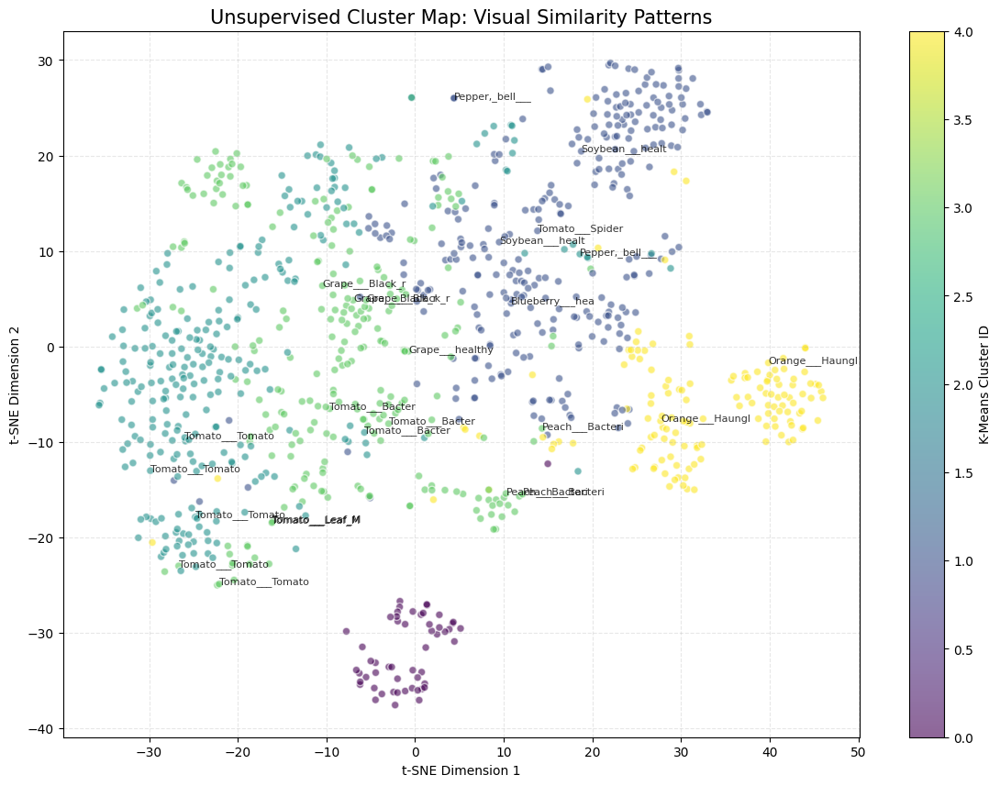

In [8]:
import torch
import torchvision.models as models
from torchvision.models import resnet50, ResNet50_Weights
import torchvision.transforms as T
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import random
from tqdm import tqdm

# 1. Load a pre-trained feature extractor (ResNet50)
# Using the modern 'weights' parameter as recommended by Neptune.ai logic
weights = ResNet50_Weights.DEFAULT
model = resnet50(weights=weights)
# Remove the final classification layer to get raw features
model = torch.nn.Sequential(*(list(model.children())[:-1])) 
model.eval()

# 2. Define preprocessing for the model
preprocess = weights.transforms()

features, labels = [], []
# We sample 1000 images for a clear visualization
sample_paths = random.sample(list(data_dir.glob('*/*.JPG')), 1000)

# 3. Extract high-dimensional features
with torch.no_grad():
    for path in tqdm(sample_paths, desc="Extracting Visual Features"):
        img = Image.open(path).convert('RGB')
        img_t = preprocess(img).unsqueeze(0)
        feat = model(img_t).flatten().numpy()
        features.append(feat)
        labels.append(path.parent.name)

# 4. Dimensionality Reduction using t-SNE
# This squashes 2048 features down to 2D for human eyes
tsne = TSNE(n_components=2, perplexity=30, random_state=42, init='pca', learning_rate='auto')
embeddings = tsne.fit_transform(np.array(features))

# 5. Unsupervised Clustering using K-Means
# We group images into 5 clusters to look for consistency patterns
kmeans = KMeans(n_clusters=5, n_init=10, random_state=42).fit(features)
cluster_labels = kmeans.labels_

# 6. Visualization
plt.figure(figsize=(14, 10))
scatter = plt.scatter(embeddings[:, 0], embeddings[:, 1], c=cluster_labels, cmap='viridis', alpha=0.6, edgecolors='w')
plt.title("Unsupervised Cluster Map: Visual Similarity Patterns", fontsize=15)
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.colorbar(scatter, label='K-Means Cluster ID')

# Optional: Annotate a few points with class names to see overlap
for i in range(0, len(embeddings), 40):
    plt.annotate(labels[i][:15], (embeddings[i, 0], embeddings[i, 1]), fontsize=8, alpha=0.8)

plt.grid(True, linestyle='--', alpha=0.3)
plt.show()